In [ ]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [1]:
import tensorflow as tf
import os 
import numpy as np
from keras.preprocessing.image import load_img,img_to_array,array_to_img
from keras.utils import to_categorical
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from keras.callbacks import Callback,EarlyStopping

2024-03-24 09:09:21.927356: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2024-03-24 09:09:21.927410: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2024-03-24 09:09:21.928956: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [2]:
import os

def list_directories(path):
    # Get a list of all items (files and directories) in the specified path
    items = os.listdir(path)
    # Filter out directories from the list of items
    directories = [item for item in items if os.path.isdir(os.path.join(path, item))]
    directories.sort()
    return directories

# Replace 'path_to_directory' with the path to the directory you want to inspect
directory_path = '/kaggle/input/fruits-and-vegetables-leaves-dataset-balanced/Fruits and Vegetables Dataset - Balanced/Train & Valid/train/'

directories = list_directories(directory_path)
# print("Directories within", directory_path, "are:")
for directory in directories:
    print(directory)

Apple___Apple_scab
Apple___Black_rot
Apple___Cedar_apple_rust
Apple___healthy
Cherry_(including_sour)___Powdery_mildew
Cherry_(including_sour)___healthy
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Corn_(maize)___Common_rust_
Corn_(maize)___Northern_Leaf_Blight
Corn_(maize)___healthy
Grape___Black_rot
Grape___Esca_(Black_Measles)
Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
Grape___healthy
Peach___Bacterial_spot
Peach___healthy
Pepper,_bell___Bacterial_spot
Pepper,_bell___healthy
Potato___Early_blight
Potato___Late_blight
Potato___healthy
Strawberry___Leaf_scorch
Strawberry___healthy
Tomato___Bacterial_spot
Tomato___Early_blight
Tomato___Late_blight
Tomato___Leaf_Mold
Tomato___Septoria_leaf_spot
Tomato___Spider_mites Two-spotted_spider_mite
Tomato___Target_Spot
Tomato___Tomato_Yellow_Leaf_Curl_Virus
Tomato___Tomato_mosaic_virus
Tomato___healthy


In [3]:
label_name = [string.replace('___',' ').replace('__',' ').replace('_', ' ') for string in directories]
print(label_name)

['Apple Apple scab', 'Apple Black rot', 'Apple Cedar apple rust', 'Apple healthy', 'Cherry (including sour) Powdery mildew', 'Cherry (including sour) healthy', 'Corn (maize) Cercospora leaf spot Gray leaf spot', 'Corn (maize) Common rust ', 'Corn (maize) Northern Leaf Blight', 'Corn (maize) healthy', 'Grape Black rot', 'Grape Esca (Black Measles)', 'Grape Leaf blight (Isariopsis Leaf Spot)', 'Grape healthy', 'Peach Bacterial spot', 'Peach healthy', 'Pepper, bell Bacterial spot', 'Pepper, bell healthy', 'Potato Early blight', 'Potato Late blight', 'Potato healthy', 'Strawberry Leaf scorch', 'Strawberry healthy', 'Tomato Bacterial spot', 'Tomato Early blight', 'Tomato Late blight', 'Tomato Leaf Mold', 'Tomato Septoria leaf spot', 'Tomato Spider mites Two-spotted spider mite', 'Tomato Target Spot', 'Tomato Tomato Yellow Leaf Curl Virus', 'Tomato Tomato mosaic virus', 'Tomato healthy']


In [4]:
len(label_name)

33

In [5]:
n_of_image = 650

In [6]:
img,label,img_size = [],[],(150,150,3)

In [7]:
for i in  range(0,33):
    path_dir = directory_path + directories[i]
    os.chdir(path_dir)
    img_path_list = os.listdir(path_dir)
    for len_no,img_path in enumerate(img_path_list):
        if len_no == n_of_image:
            break
        else:
            img.append(img_to_array(load_img(img_path,target_size=img_size))/255)
            label.append(i)

In [10]:
img,label = np.array(img),np.array(label)

In [11]:
from collections import Counter 
Counter(label)

Counter({0: 650,
         1: 650,
         2: 650,
         3: 650,
         4: 650,
         5: 650,
         6: 650,
         7: 650,
         8: 650,
         9: 650,
         10: 650,
         11: 650,
         12: 650,
         13: 650,
         14: 650,
         15: 650,
         16: 650,
         17: 650,
         18: 650,
         19: 650,
         20: 650,
         21: 650,
         22: 650,
         23: 650,
         24: 650,
         25: 650,
         26: 650,
         27: 650,
         28: 650,
         29: 650,
         30: 650,
         31: 650,
         32: 650})

In [12]:
IMG_SHAPE = img_size
vgg = tf.keras.applications.vgg16.VGG16(weights='imagenet', include_top=False, input_shape=IMG_SHAPE)

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [13]:
vgg.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)        │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 14,714,688 (56.13 MB)

 Non-trainable params: 0 (0.00 B)

In [14]:
vgg.trainable = False

In [15]:
import pandas as pd

pd.set_option('max_colwidth', None)

layer_vgg = [(layer, layer.name, layer.trainable) for layer in vgg.layers]
pd.DataFrame(layer_vgg, columns=['Layer Type', 'Layer Name', 'Layer Trainable'])

,Layer Type,Layer Name,Layer Trainable
0,"<InputLayer name=input_layer, built=True>",input_layer,False
1,"<Conv2D name=block1_conv1, built=True>",block1_conv1,False
2,"<Conv2D name=block1_conv2, built=True>",block1_conv2,False
3,"<MaxPooling2D name=block1_pool, built=True>",block1_pool,False
4,"<Conv2D name=block2_conv1, built=True>",block2_conv1,False
5,"<Conv2D name=block2_conv2, built=True>",block2_conv2,False
6,"<MaxPooling2D name=block2_pool, built=True>",block2_pool,False
7,"<Conv2D name=block3_conv1, built=True>",block3_conv1,False
8,"<Conv2D name=block3_conv2, built=True>",block3_conv2,False
9,"<Conv2D name=block3_conv3, built=True>",block3_conv3,False


In [17]:
# average_pool = tf.keras.layers.GlobalAveragePooling2D(name='my_avg_2d_pool')

# prediction = tf.keras.Sequential([
#                 tf.keras.layers.Flatten(name="my_flatten"),
#                 tf.keras.layers.Dense(38,activation='softmax',name='my_output_1')           
# ])

# tl_model = tf.keras.Sequential([
#   vgg,
#   average_pool,
#   prediction,
#   ])

In [18]:
# tl_model.summary()

In [24]:
import tensorflow as tf

# Define the base VGG16 model
vgg = tf.keras.applications.VGG16(weights='imagenet', include_top=False, input_shape=(150, 150, 3))
vgg.trainable = False

# Define the average pooling layer
avg_pooling = tf.keras.layers.GlobalAveragePooling2D(name='my_avg_2d_pool')(vgg.output)

# Define the flatten layer
flatten = tf.keras.layers.Flatten(name="my_flatten")(avg_pooling)

# Define the output layer
output = tf.keras.layers.Dense(33, activation='softmax', name='my_output_1')(flatten)

# Create a model using the functional API
tl_model = tf.keras.Model(inputs=vgg.input, outputs=output)

# Display the summary of the model
tl_model.summary()


Model: "functional_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_2 (InputLayer)      │ (None, 150, 150, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv1 (Conv2D)           │ (None, 150, 150, 64)   │         1,792 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_conv2 (Conv2D)           │ (None, 150, 150, 64)   │        36,928 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block1_pool (MaxPooling2D)      │ (None, 75, 75, 64)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv1 (Conv2D)           │ (None, 75, 75, 128)    │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_conv2 (Conv2D)           │ (None, 75, 75, 128)    │       147,584 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block2_pool (MaxPooling2D)      │ (None, 37, 37, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv1 (Conv2D)           │ (None, 37, 37, 256)    │       295,168 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv2 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_conv3 (Conv2D)           │ (None, 37, 37, 256)    │       590,080 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block3_pool (MaxPooling2D)      │ (None, 18, 18, 256)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv1 (Conv2D)           │ (None, 18, 18, 512)    │     1,180,160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv2 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_conv3 (Conv2D)           │ (None, 18, 18, 512)    │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block4_pool (MaxPooling2D)      │ (None, 9, 9, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv1 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv2 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_conv3 (Conv2D)           │ (None, 9, 9, 512)      │     2,359,808 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ block5_pool (MaxPooling2D)      │ (None, 4, 4, 512)      │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ my_avg_2d_pool                  │ (None, 512)            │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ my_flatten (Flatten)            │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ my_output_1 (Dense)             │ (None, 33)             │        16,929 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 14,731,617 (56.20 MB)

 Trainable params: 16,929 (66.13 KB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [25]:
tl_model.compile(optimizer=tf.keras.optimizers.Adam(),
              loss='categorical_crossentropy',
              metrics=['accuracy'])

In [26]:
img,img_test,label,label_test = train_test_split(img,label,test_size=0.25,random_state=10)

In [27]:
class mycallback(Callback):
      def on_train_end(self,epoch,log={}):
        if (log.get('val_accuracy') >= '0.70'):
                  print('Reached 70.9% accuracy so cancelling training')
                  self.model.stop_training = True

In [28]:
castom_call = mycallback()
early_stop = EarlyStopping(monitor='val_accuracy', patience=3)

history = tl_model.fit(img,to_categorical(label), epochs=10, validation_data=(img_test,to_categorical(label_test)))

Epoch 1/10
  3/378 ━━━━━━━━━━━━━━━━━━━━ 23s 64ms/step - accuracy: 0.0312 - loss: 3.6552 

I0000 00:00:1711271627.716999     114 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.
W0000 00:00:1711271627.736066     114 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


378/378 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step - accuracy: 0.2855 - loss: 3.0255

W0000 00:00:1711271657.995426     116 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


378/378 ━━━━━━━━━━━━━━━━━━━━ 69s 134ms/step - accuracy: 0.2860 - loss: 3.0244 - val_accuracy: 0.6497 - val_loss: 1.9407
Epoch 2/10
  1/378 ━━━━━━━━━━━━━━━━━━━━ 33s 90ms/step - accuracy: 0.6250 - loss: 1.8760

W0000 00:00:1711271678.152552     117 graph_launch.cc:671] Fallback to op-by-op mode because memset node breaks graph update


378/378 ━━━━━━━━━━━━━━━━━━━━ 34s 91ms/step - accuracy: 0.6772 - loss: 1.7524 - val_accuracy: 0.7118 - val_loss: 1.4098
Epoch 3/10
378/378 ━━━━━━━━━━━━━━━━━━━━ 33s 87ms/step - accuracy: 0.7257 - loss: 1.3239 - val_accuracy: 0.7424 - val_loss: 1.1636
Epoch 4/10
378/378 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - accuracy: 0.7525 - loss: 1.1036 - val_accuracy: 0.7566 - val_loss: 1.0205
Epoch 5/10
378/378 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - accuracy: 0.7786 - loss: 0.9501 - val_accuracy: 0.7727 - val_loss: 0.9231
Epoch 6/10
378/378 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - accuracy: 0.7946 - loss: 0.8577 - val_accuracy: 0.7839 - val_loss: 0.8532
Epoch 7/10
378/378 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - accuracy: 0.8032 - loss: 0.7955 - val_accuracy: 0.7936 - val_loss: 0.7985
Epoch 8/10
378/378 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - accuracy: 0.8156 - loss: 0.7315 - val_accuracy: 0.8043 - val_loss: 0.7519
Epoch 9/10
378/378 ━━━━━━━━━━━━━━━━━━━━ 34s 89ms/step - accuracy: 0.8244 - loss: 0.6923 - val_accurac

In [29]:
# Specify the file path for saving the model
model_filepath = '/kaggle/working/tl_model.h5'

# Save the model
tl_model.save(model_filepath)

In [30]:
# Load the saved model
loaded_model = tf.keras.models.load_model(model_filepath)

In [ ]:
# import os

# # Specify the file path
# file_path = '/kaggle/working/leaf_model.keras'

# # Check if the file exists before attempting to delete
# if os.path.exists(file_path):
#     # Delete the file
#     os.remove(file_path)
#     print(f"The file '{file_path}' has been deleted.")
# else:
#     print(f"The file '{file_path}' does not exist.")


In [ ]:
# import shutil

# # Specify the folder path
# folder_path = '/kaggle/working/saved_models'

# # Check if the folder exists before attempting to delete
# if os.path.exists(folder_path):
#     # Delete the folder and all its contents
#     shutil.rmtree(folder_path)
#     print(f"The folder '{folder_path}' has been deleted.")
# else:
#     print(f"The folder '{folder_path}' does not exist.")


In [ ]:
import os

# Define the directory name
directory = '/kaggle/working/saved_models'

# Create the directory if it doesn't exist
if not os.path.exists(directory):
    os.makedirs(directory)
    print(f"Directory '{directory}' created successfully.")
else:
    print(f"Directory '{directory}' already exists.")


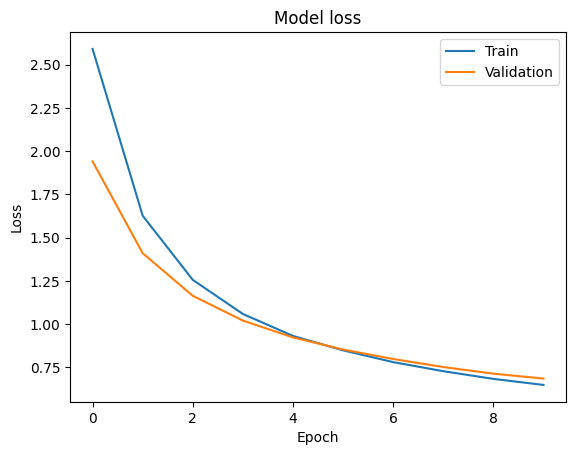

In [31]:
import matplotlib.pyplot as plt

plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])

plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')

plt.legend(['Train', 'Validation'], loc='upper right')
plt.show()

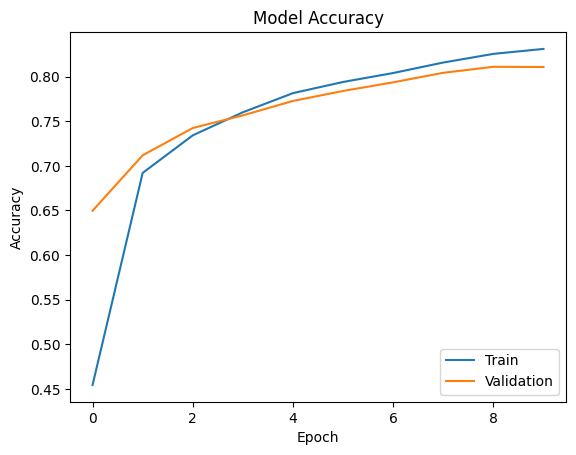

In [32]:
import matplotlib.pyplot as plt
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])

plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.savefig('/kaggle/working/'+'accuracy.png')
plt.legend(['Train', 'Validation'], loc='lower right')
plt.show()

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step


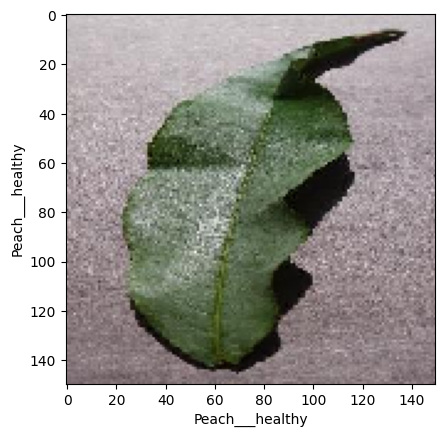

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


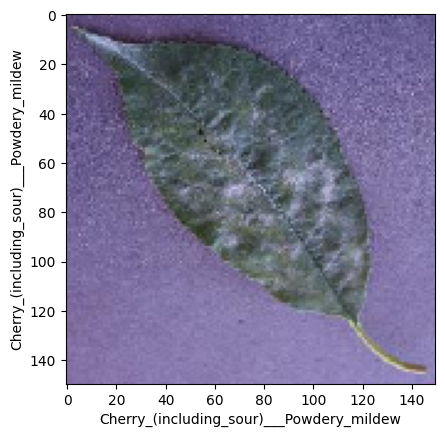

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 23ms/step


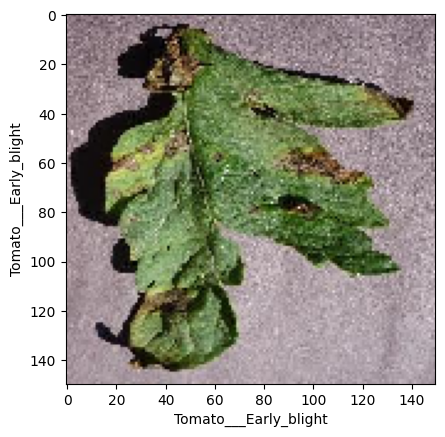

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


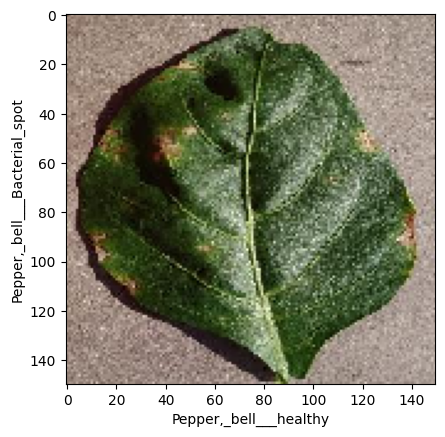

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


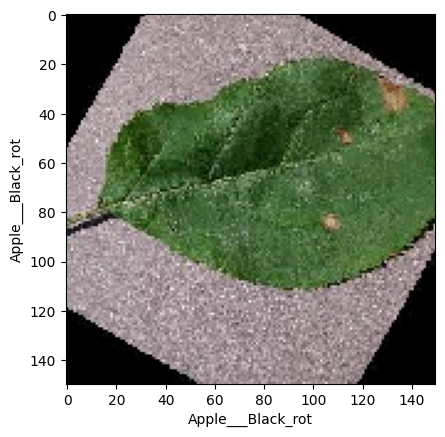

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


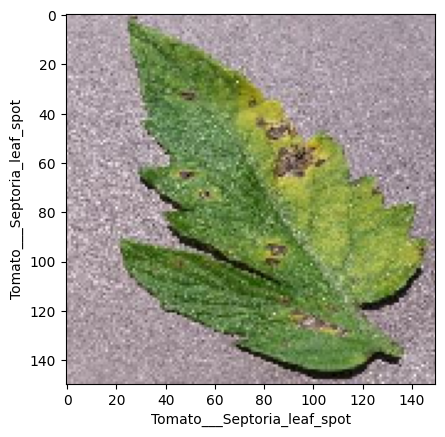

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


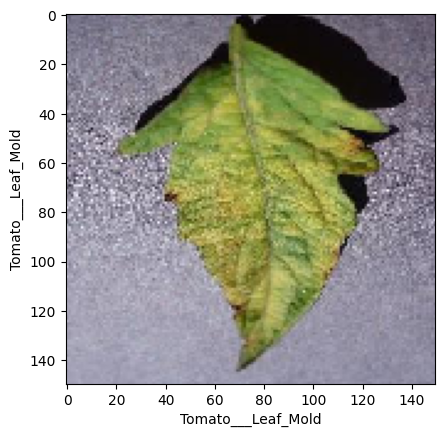

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


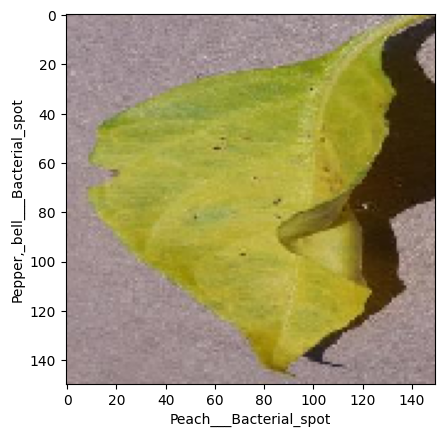

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


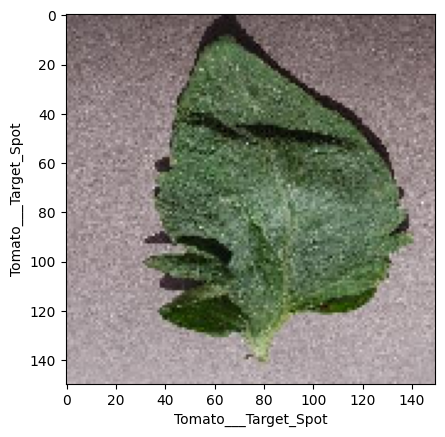

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


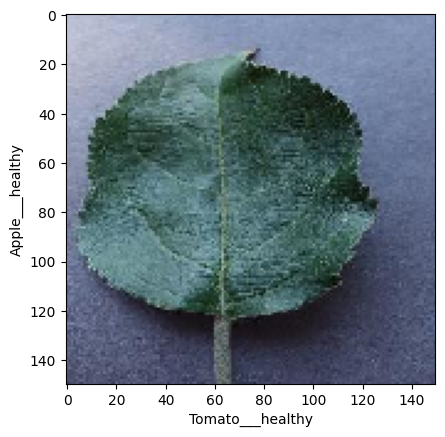

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


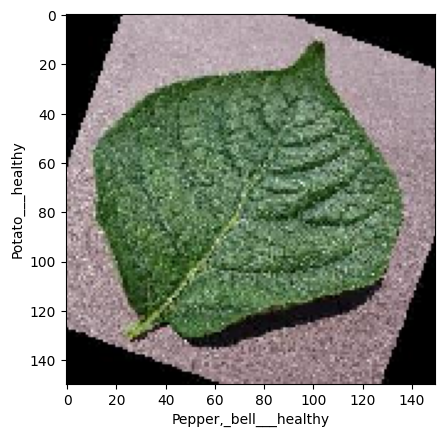

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


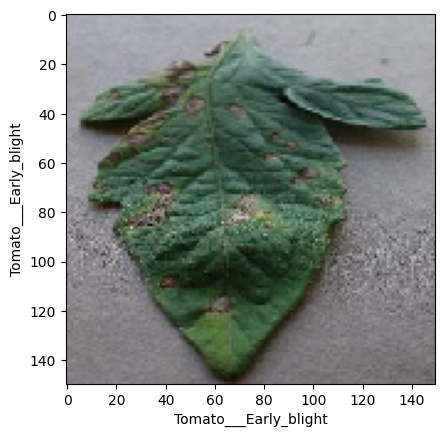

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


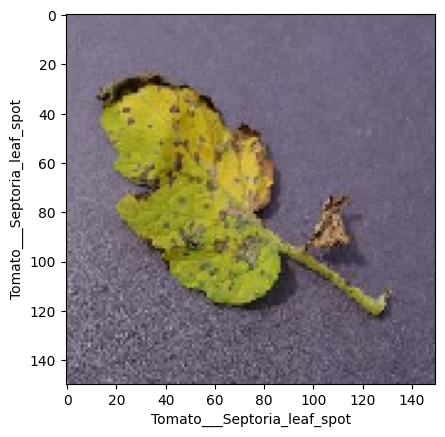

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


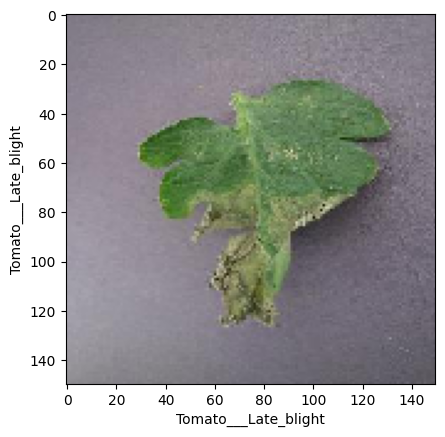

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


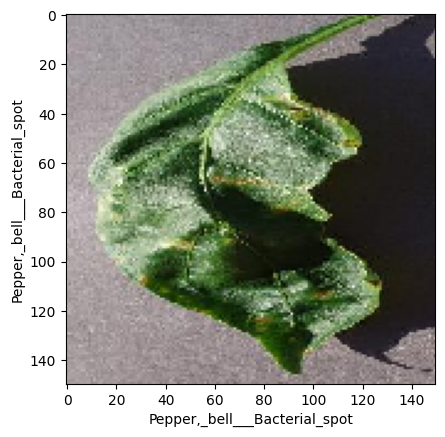

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


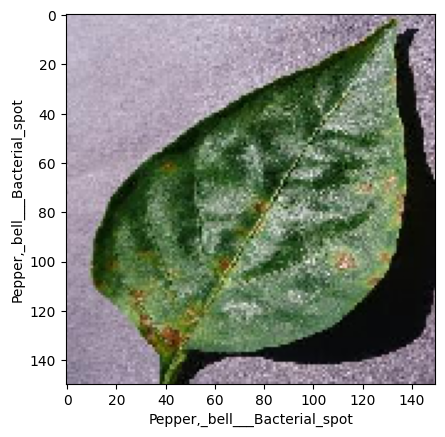

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


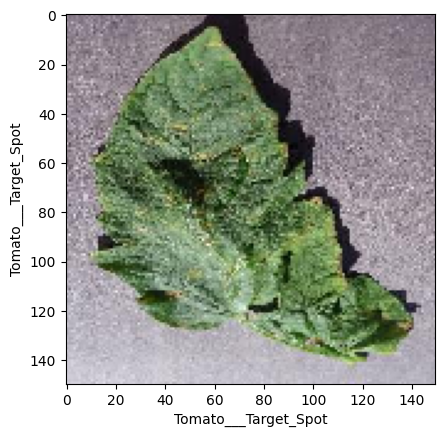

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


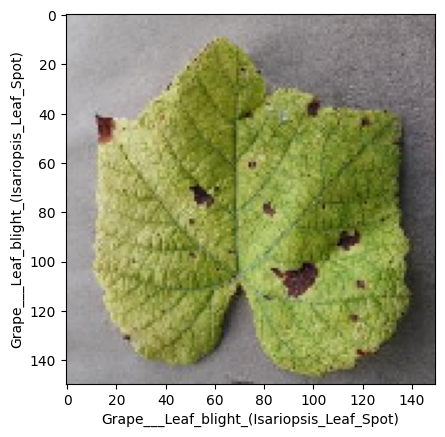

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


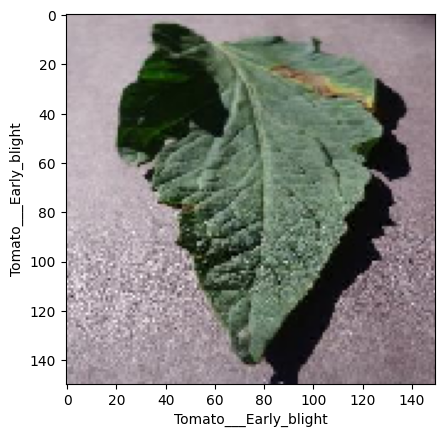

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


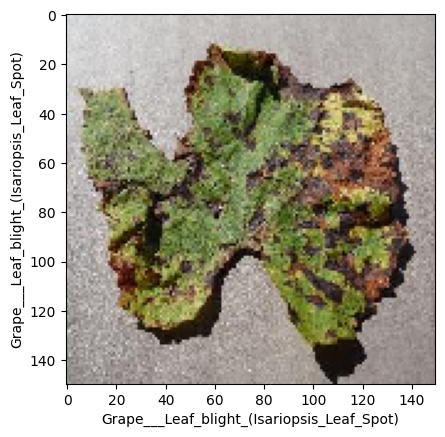

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


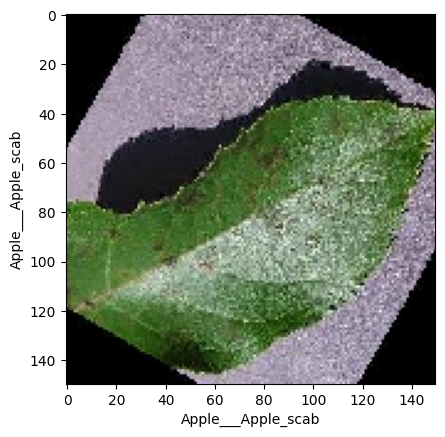

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


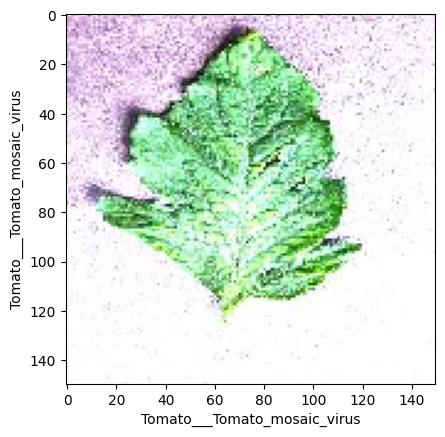

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


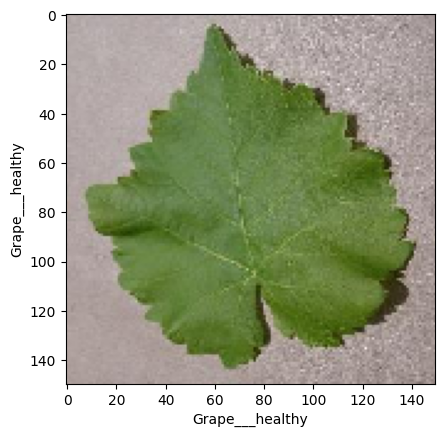

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


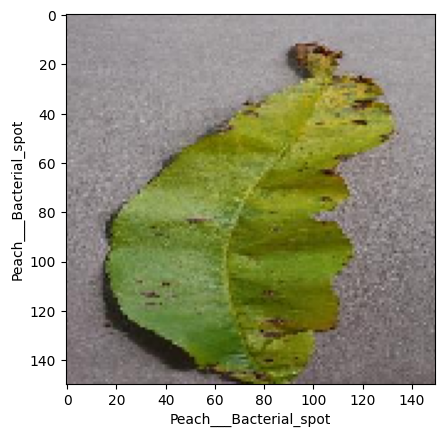

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


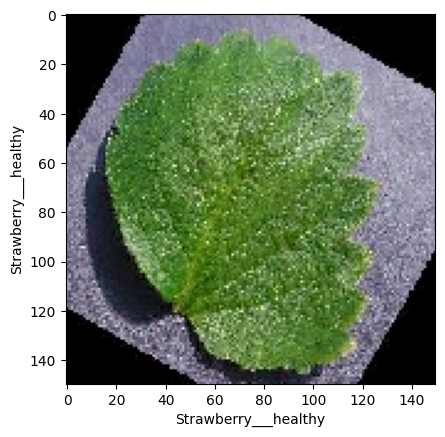

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


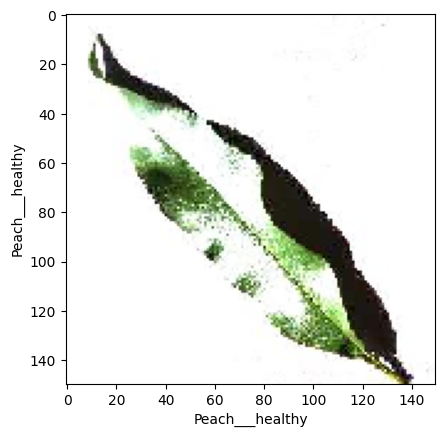

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


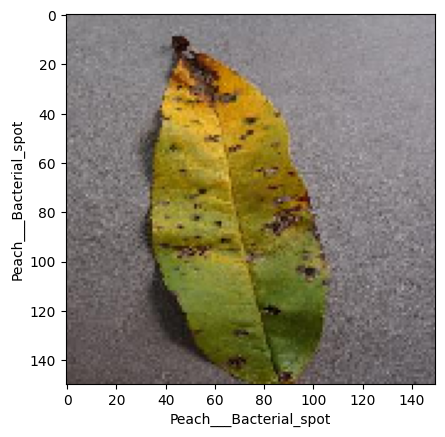

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


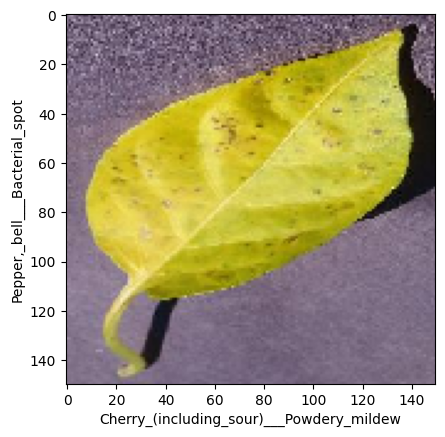

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


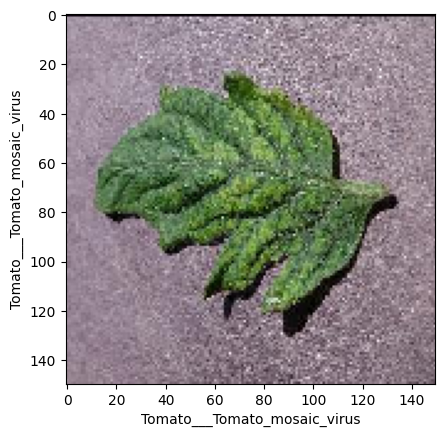

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


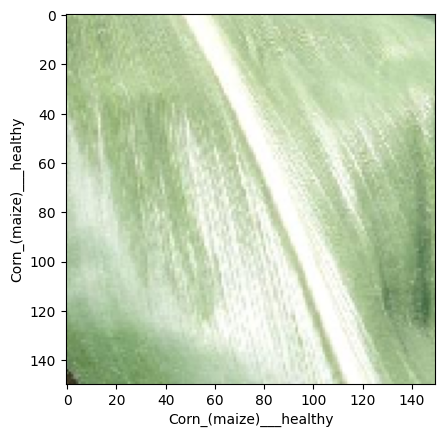

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


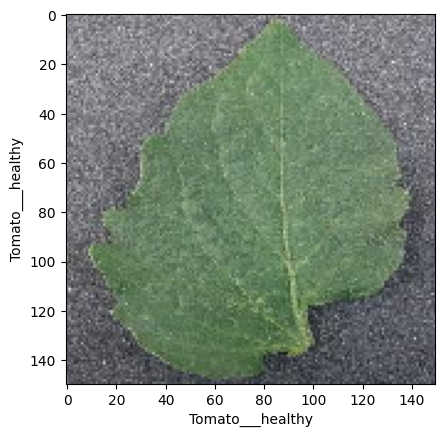

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


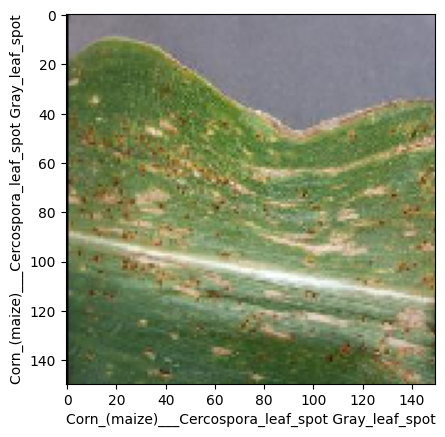

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


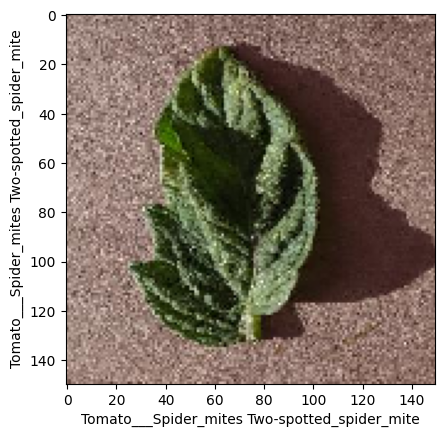

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


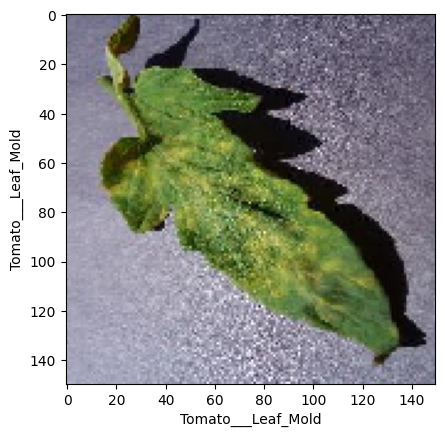

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


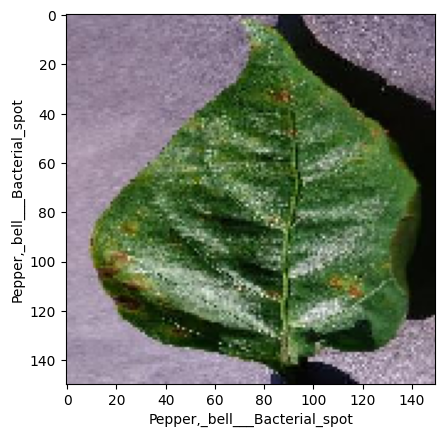

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


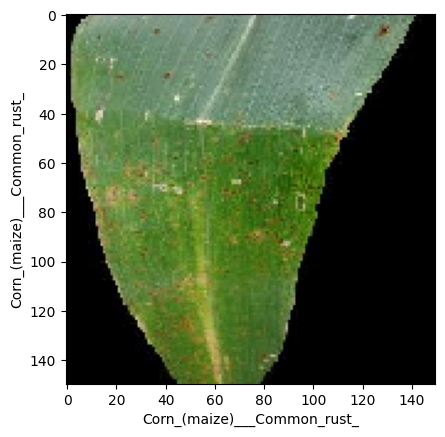

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


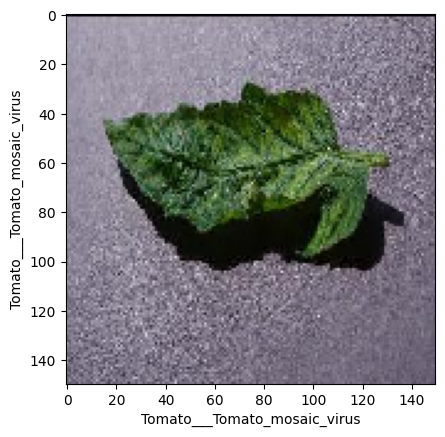

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


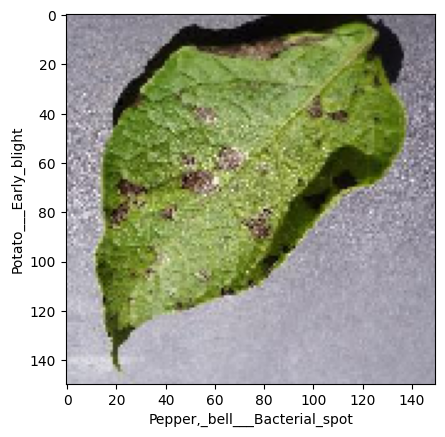

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


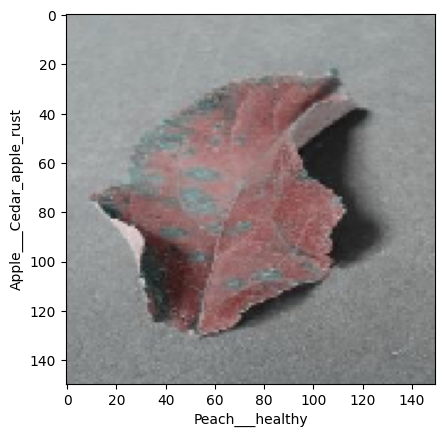

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


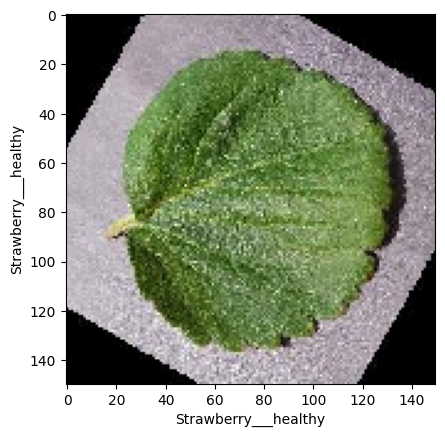

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


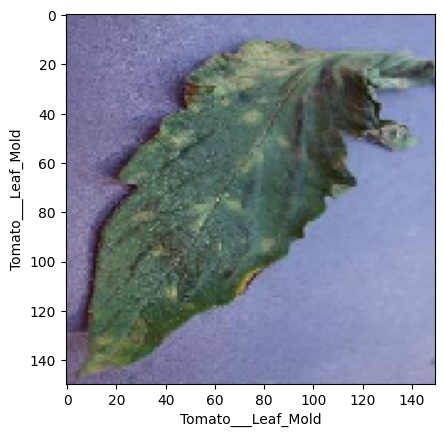

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 20ms/step


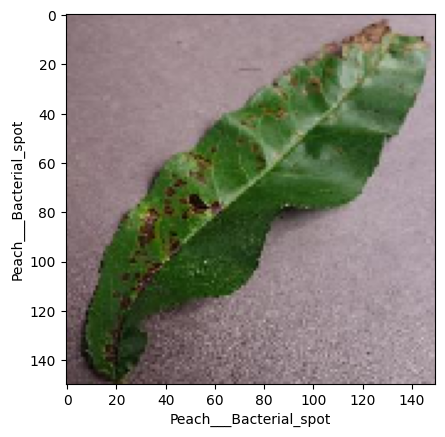

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


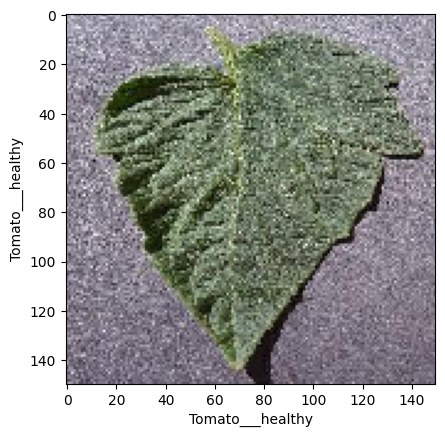

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


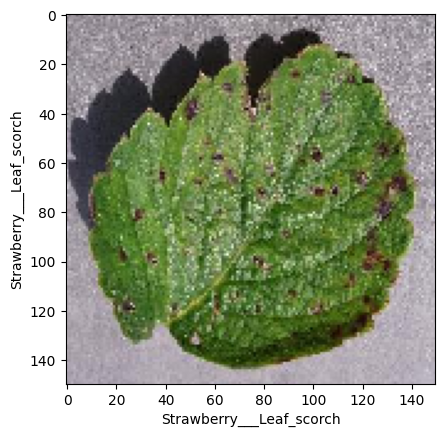

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


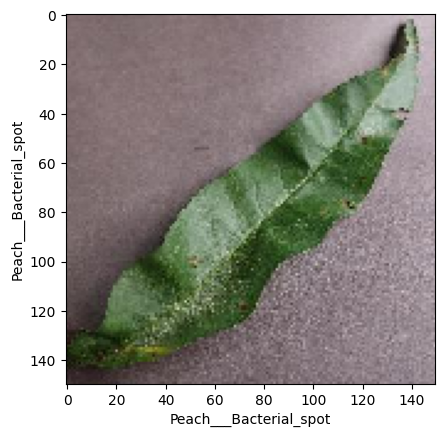

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


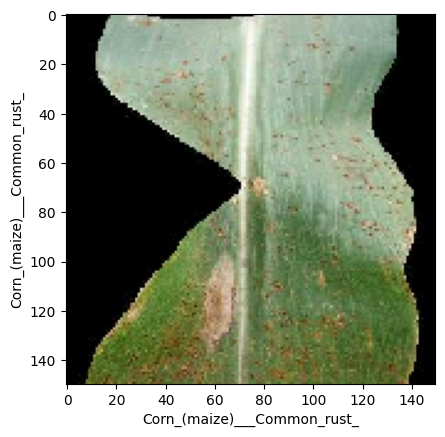

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step


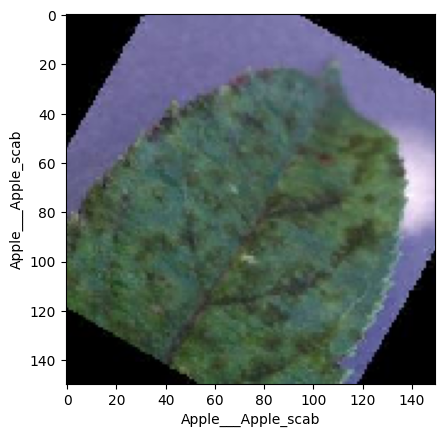

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


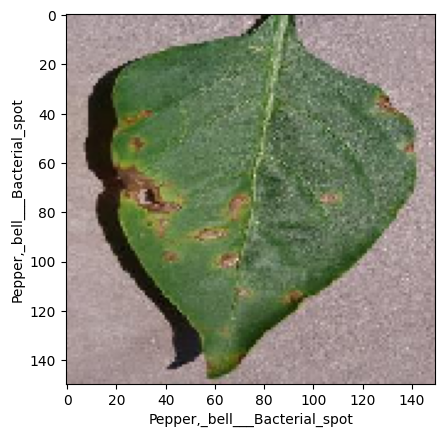

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


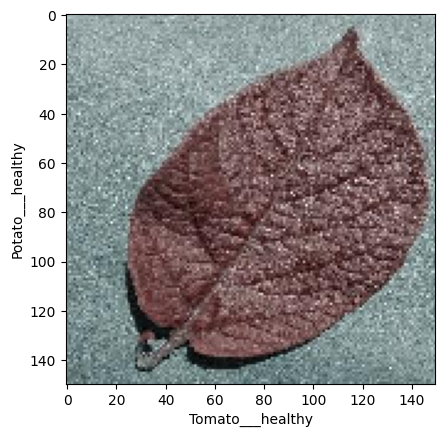

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 19ms/step


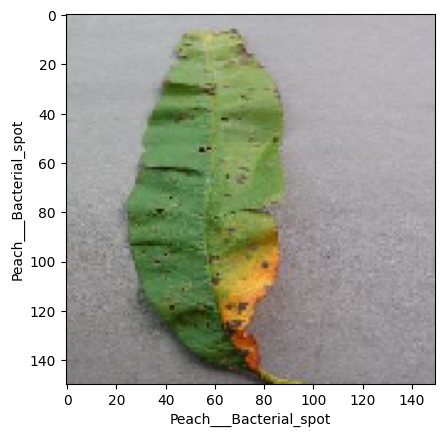

In [33]:
for i in range(50):
    plt.imshow(img_test[i])
    plt.ylabel(directories[label_test[i]])
    img = img_test[i]
    pr = loaded_model.predict(img.reshape((1,)+img.shape)) 
    plt.xlabel(directories[np.argmax(pr)])
    plt.show()
    plt.close()